<a href="https://colab.research.google.com/github/nilakshi104/Staircase-Segmentation/blob/master/Staircase_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

Importing libraries

In [ ]:
from fastai import *
from fastai.vision import *
# from fastai.callbacks import *
import glob
import cv2
import numpy as np

list of labels is defined in text file and that file is loaded here


In [ ]:
colors = np.loadtxt('Dataset/stair.txt',delimiter='\n',dtype=str);
colors

array(['Background', 'Stairedge'], dtype='<U10')

In [ ]:
path_images='Dataset/train'
path_valid='Dataset/val'
fnames=get_image_files(path_images)

get_image_files Return list of files in path_images that are images.

In [ ]:
import posixpath
get_y_fn = lambda x: (posixpath.join('Dataset/train_masks',f'{x.stem}_mask1{x.suffix}')) if (x.parent.stem == 'train') else (posixpath.join('Dataset/val_masks',f'{x.stem}_mask1{x.suffix}'))
# get_y_fn=lambda x:path_lbl/f'{x.stem}_mask{x.suffix}'

In [ ]:
class SegLabelListCustom(SegmentationLabelList):
        def open(self, fn): return open_mask(fn, div=True)

class SegItemListCustom(SegmentationItemList):
    _label_cls = SegLabelListCustom

In [ ]:
src = (SegItemListCustom.from_folder(Path('Dataset'))
   .split_by_folder(train='train',valid='val')
   .label_from_func(get_y_fn, classes=colors)
   .transform(get_transforms(),tfm_y=True, size=(480,640))#tfms_y=True because transforms we r applying on trainset,will be also applied on train_masks
   .add_test_folder(test_folder='test',tfms=None,tfm_y=False)#since test_masks are empty we dont need tfms on ground truth here so tfm_y=False
   )

#src_size=(480,640)

In [ ]:
# tfms = get_transforms(do_flip=True,size=src_size//2)
data = (src
        .databunch(bs=8)
        .normalize(imagenet_stats))

In [ ]:
# class FocalLoss(nn.Module):
#     def __init__(self, alpha=1.,gamma=2.,reduction='mean'):
#         super(FocalLoss,self).__init__()
#         self.alpha = alpha
#         self.gamma = gamma
#         self.reduction=reduction

#     def forward(self, inputs, targets):
#         CE_loss = torch.nn.CrossEntropyLoss(reduction=self.reduction)(inputs, targets.squeeze(1))
#         pt = torch.exp(-CE_loss)
#         F_loss = self.alpha * ((1-pt)**self.gamma) * CE_loss
#         return F_loss

In [ ]:
# #FOR SINGLE IMG

# def f2_score(input,target):
#   f=0
#   input=input.to("cpu")
#   target=target.to("cpu")
#   input=input.argmax(dim=1)
#   for i in range(input.shape[0]):
#     input1=input[i,:,:]
#     input1=input1.reshape(-1,1)
#     input1=input1.squeeze(1)
#     target1=target[i,:,:]
#     target1=target1.reshape(-1,1)
#     target1=target1.squeeze(1)
#     # precision_score(targets, inputs, labels=None, pos_label=1, average='binary', sample_weight=None, zero_division='warn')
#     # recall_score(targets,inputs, labels=None, pos_label=1, average='binary', sample_weight=None, zero_division='warn')
#     k=fbeta_score(target1, input1, beta=2)
#     f+=k
#     # print(f"{num}:{k}")

#   return torch.tensor(f/input.shape[0])

In [ ]:
# def fit_sgd_warm(learn,n_cycles,lr, mom, cycle_len, cycle_mult):
#     n = len(learn.data.train_dl)
#     phases = [(TrainingPhase(n * (cycle_len * cycle_mult**i))
#                  .schedule_hp('lr', lr, anneal=annealing_cos)
#                  .schedule_hp('mom', mom)) for i in range(n_cycles)]
#     sched = GeneralScheduler(learn, phases)
#     learn.callbacks.append(sched)
#     if cycle_mult != 1:
#         total_epochs = int(cycle_len * (1 - (cycle_mult)**n_cycles)/(1-cycle_mult)) 
#     else: total_epochs = n_cycles * cycle_len
#     learn.fit(total_epochs)

In [ ]:
learn = unet_learner(data,models.resnet34)
#try resnet54
#learn.freeze()    #NO NEED TO START MODEL WITH LEARN.FREEZE()...BUT IF MODEL IS UNFREEZED AND V NEED TO FREEZE IT AGAIN THEN WE NEED TO SPECIFY

In [ ]:
learn.load('stage-1-unfreeze')

Learner(data=ImageDataBunch;

Train: LabelList (771 items)
x: SegItemListCustom
Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640)
y: SegLabelListCustom
ImageSegment (1, 480, 640),ImageSegment (1, 480, 640),ImageSegment (1, 480, 640),ImageSegment (1, 480, 640),ImageSegment (1, 480, 640)
Path: Dataset;

Valid: LabelList (97 items)
x: SegItemListCustom
Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640)
y: SegLabelListCustom
ImageSegment (1, 480, 640),ImageSegment (1, 480, 640),ImageSegment (1, 480, 640),ImageSegment (1, 480, 640),ImageSegment (1, 480, 640)
Path: Dataset;

Test: LabelList (95 items)
x: SegItemListCustom
Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640),Image (3, 480, 640)
y: EmptyLabelList
,,,,
Path: Dataset, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3),

In [ ]:
def evaluate(file,save=True):
    test_image = open_image(file)
    img_segment = learn.predict(test_image)[0]
    test_image_data=test_image.data.permute(1,2,0)
    img_segment_data=img_segment.data*255
    img_segment_data=img_segment_data.permute(1,2,0)
    mask=img_segment.data.permute(1,2,0).numpy()
    mask=(np.squeeze(mask,axis=2))*255
    plt.imshow(mask)
    plt.show()
    if save:
        cv2.imwrite('Dataset/Results/mask/'+file.split('/')[-1],mask)
    for i in range(img_segment_data.size(0)):
        for j in range(img_segment_data.size(1)):
            if img_segment_data[i,j,0] == tensor(255):
                test_image_data[i,j,:]=torch.tensor([255,255,0])

    output_numpy=test_image_data.numpy()
    plt.imshow(output_numpy)
    plt.show()
    if save:
        cv2.imwrite('Dataset/Results/image_with_mask/'+file.split('/')[-1],output_numpy*255)
    
def resize_image(location):
    matrix=cv2.imread(location)
    matrix=cv2.resize(matrix,(640,480))
#     print(type(matrix))
    cv2.imwrite(location,matrix)
    

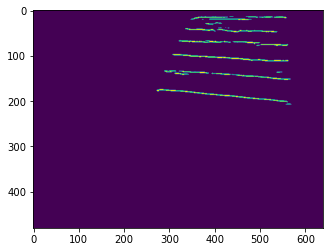

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


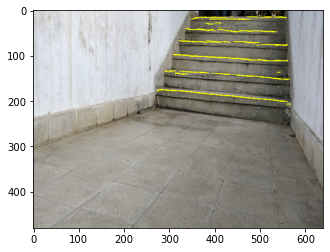

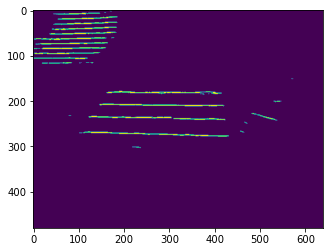

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


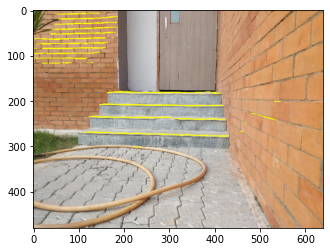

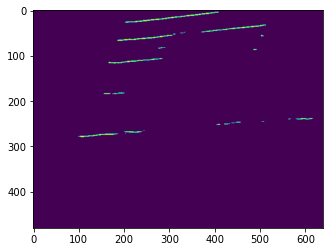

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


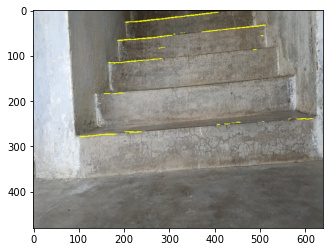

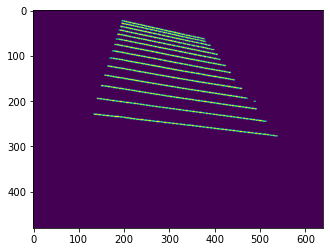

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


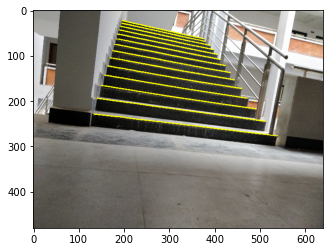

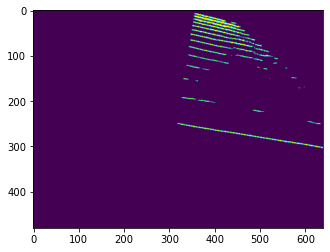

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


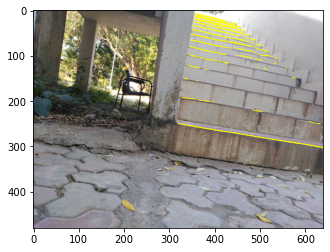

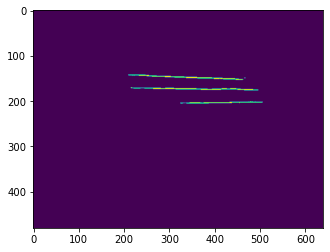

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


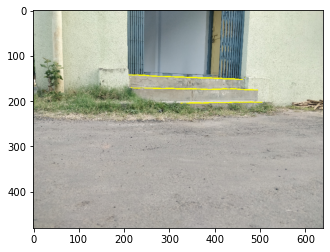

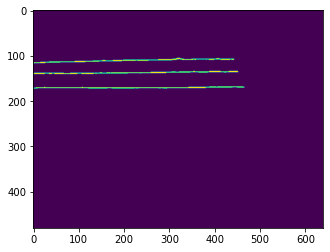

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


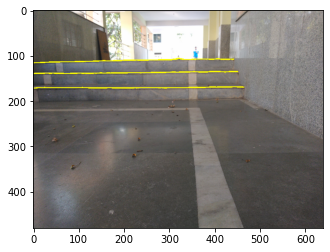

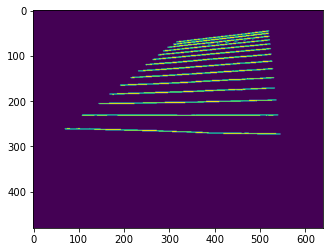

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


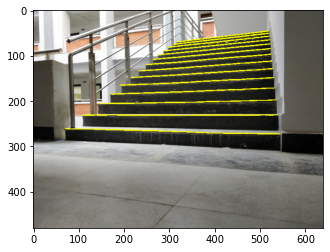

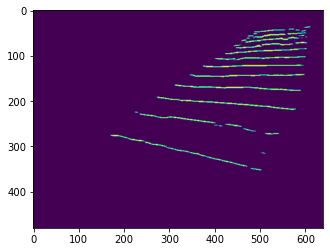

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


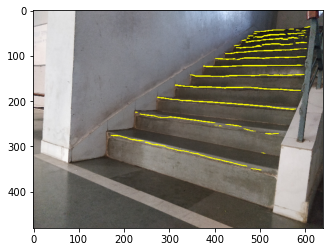

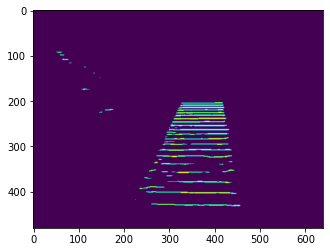

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


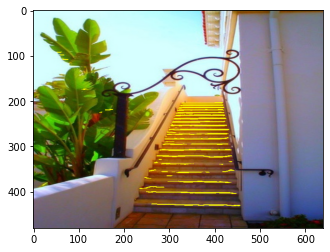

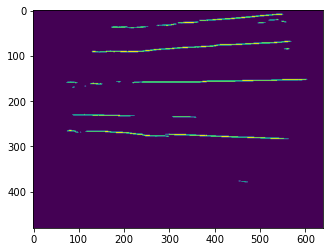

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


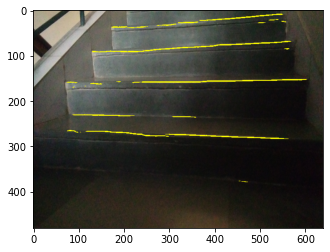

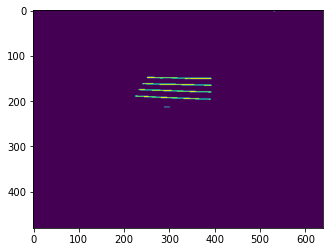

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


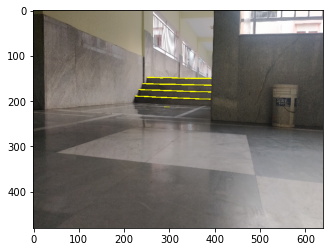

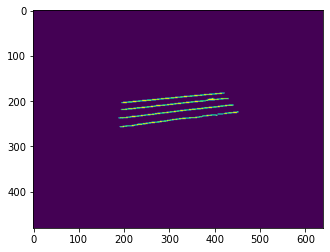

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


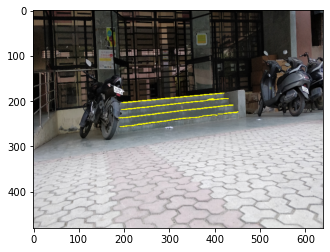

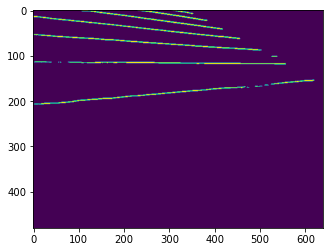

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


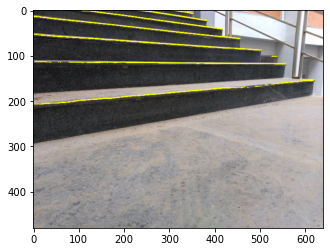

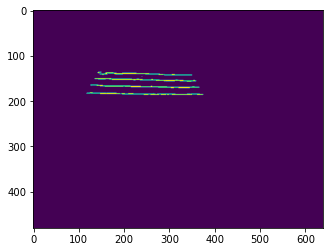

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


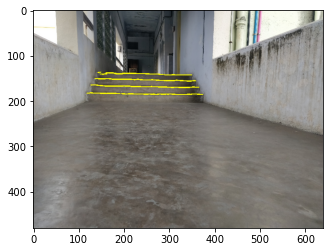

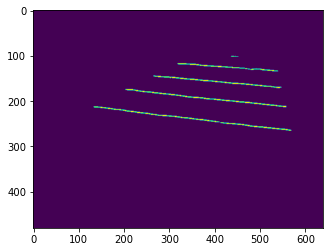

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


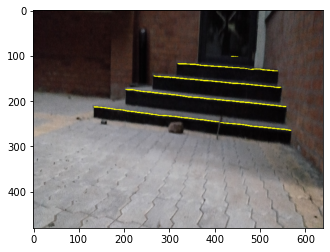

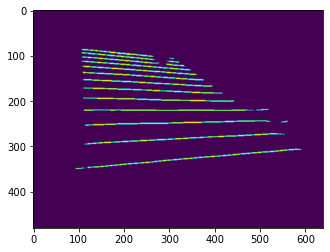

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


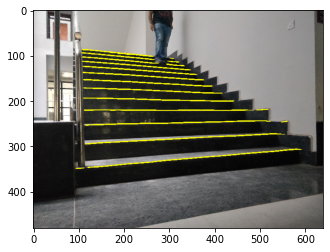

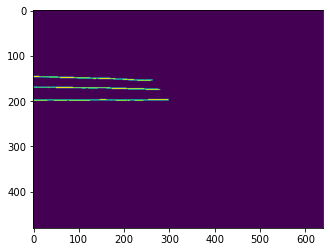

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


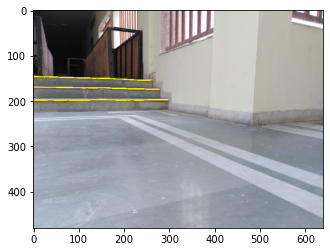

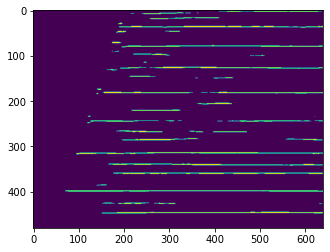

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


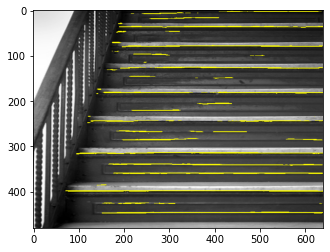

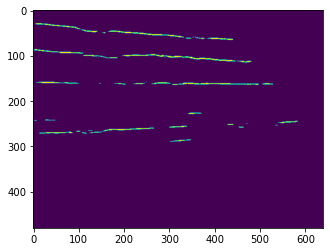

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


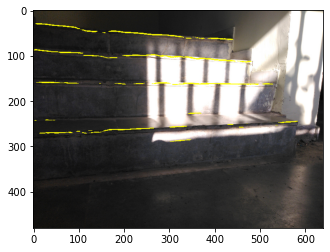

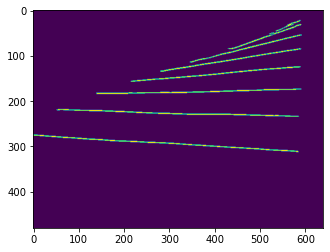

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


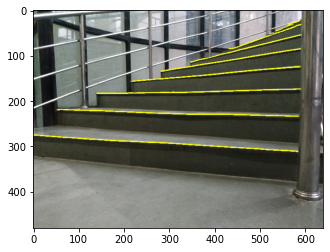

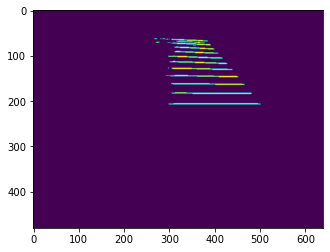

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


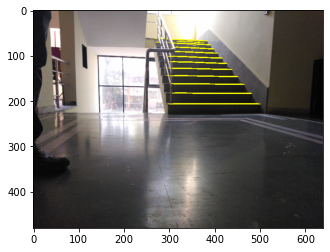

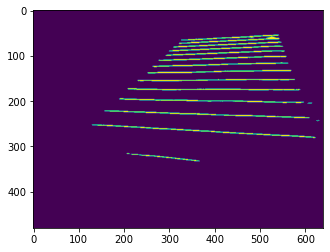

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


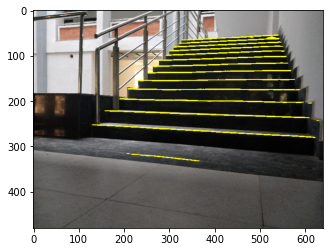

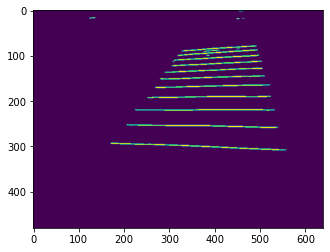

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


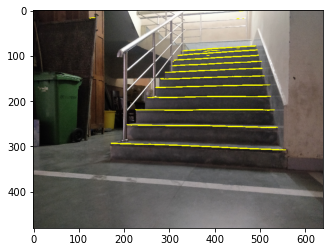

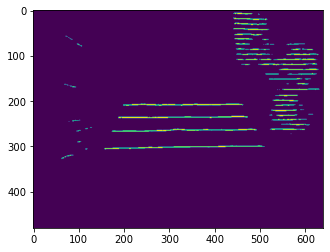

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


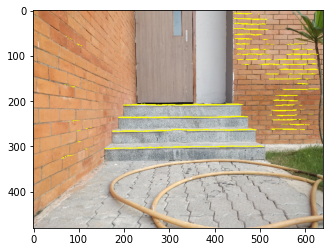

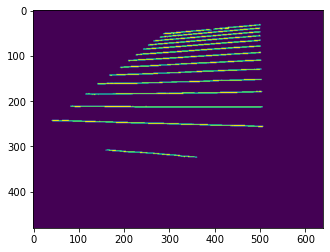

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


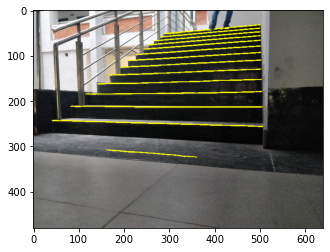

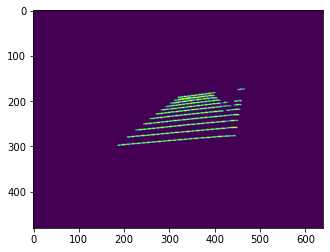

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


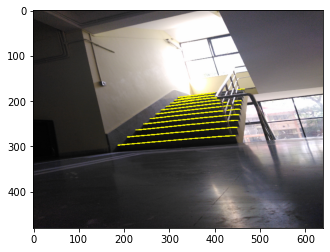

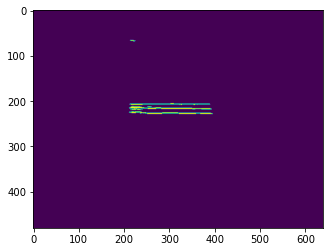

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


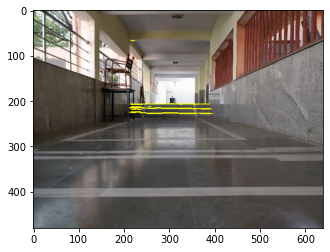

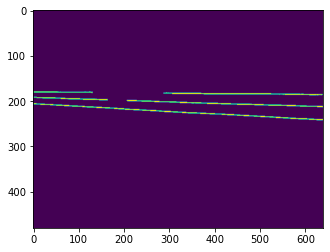

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


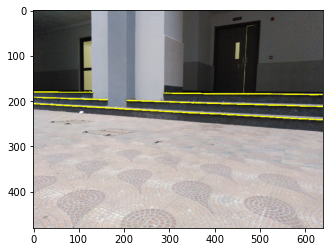

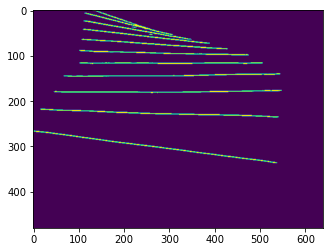

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


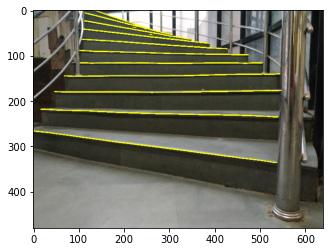

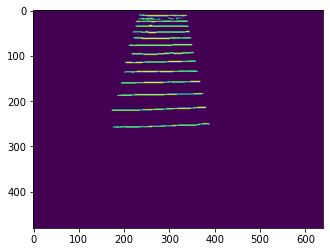

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


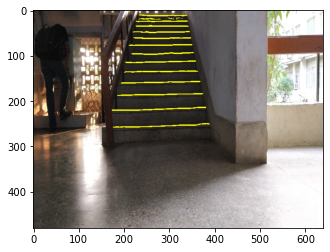

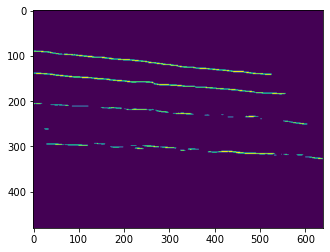

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


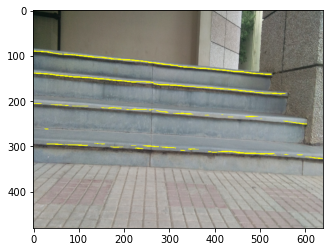

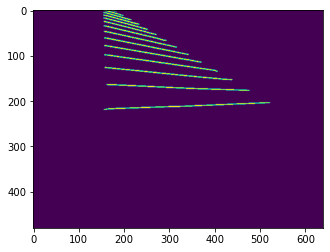

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


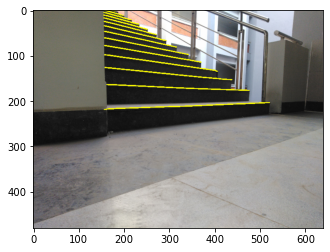

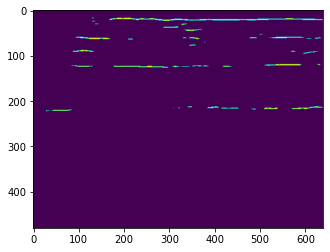

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


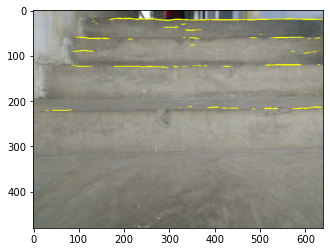

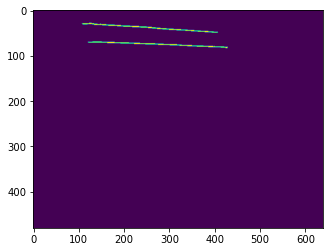

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


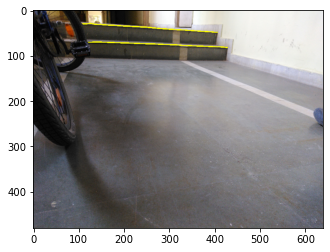

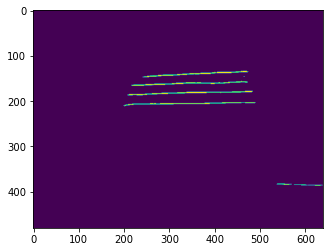

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


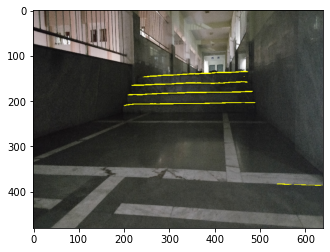

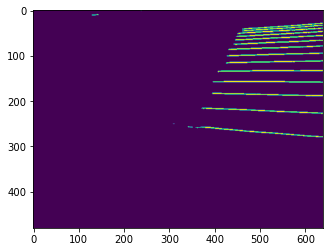

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


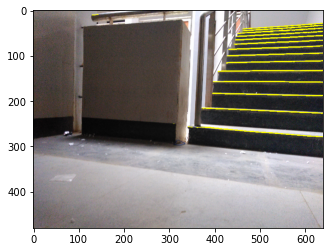

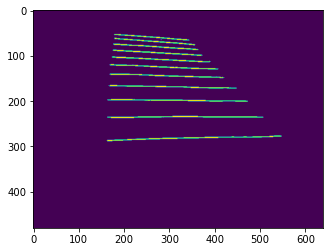

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


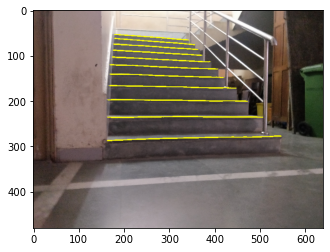

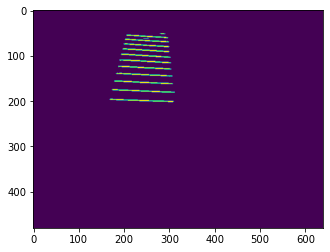

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


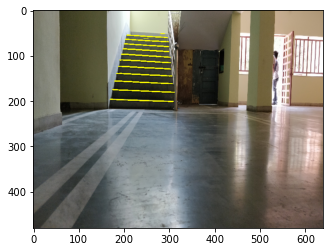

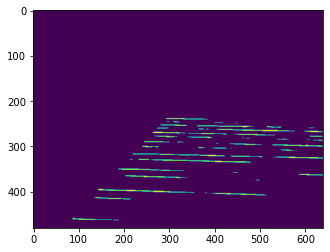

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


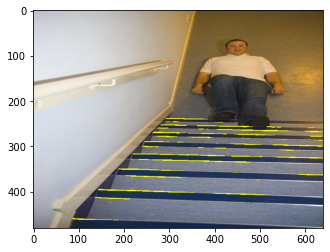

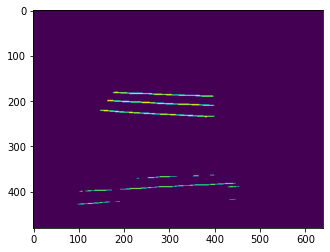

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


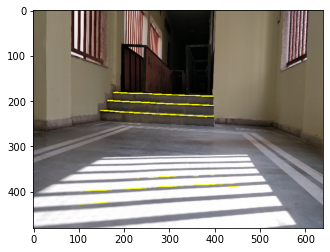

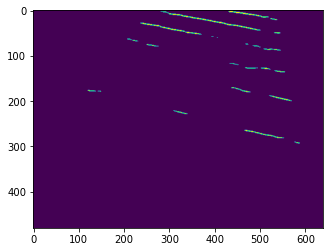

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


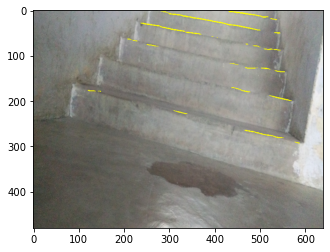

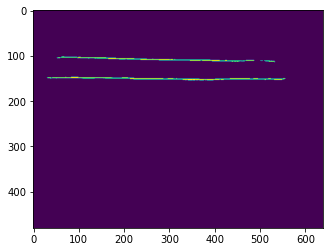

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


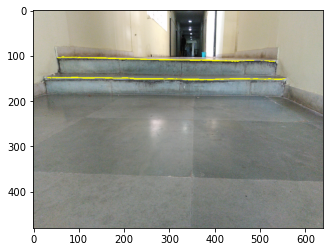

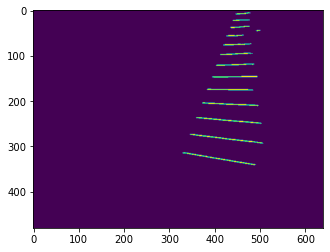

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


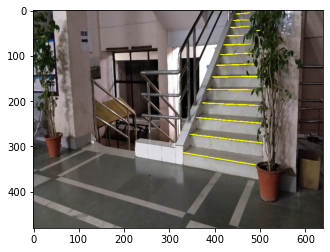

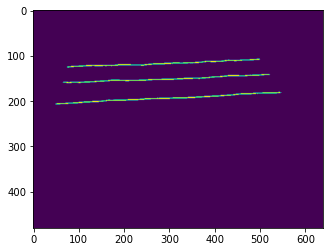

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


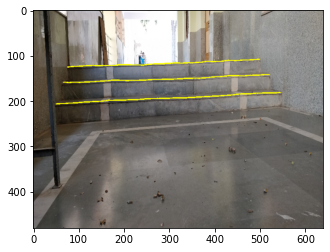

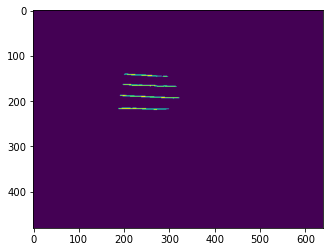

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


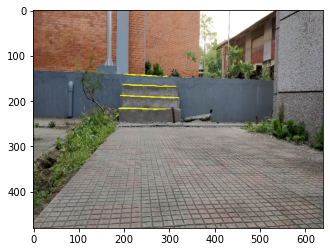

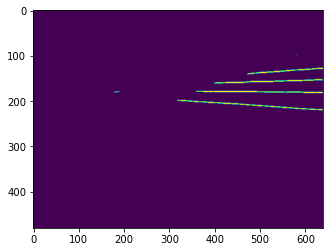

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


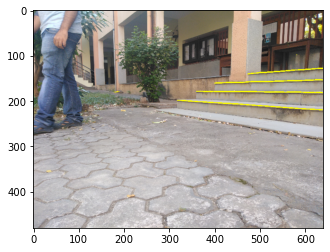

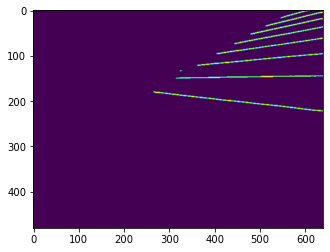

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


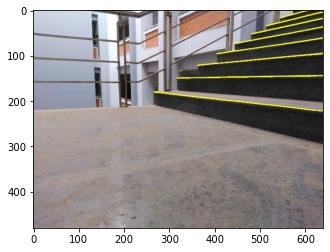

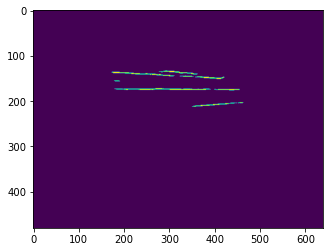

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


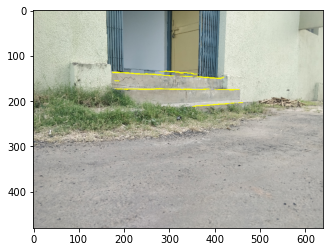

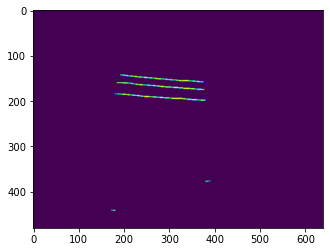

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


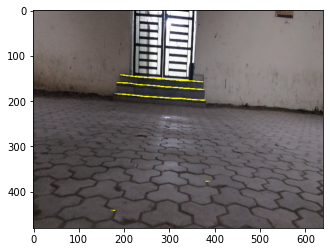

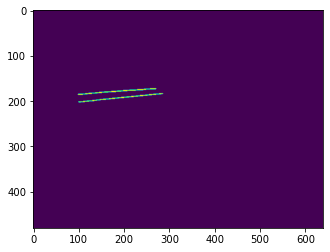

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


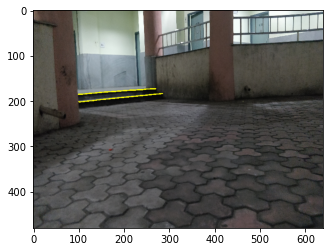

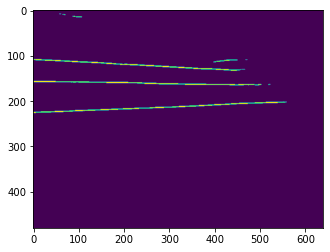

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


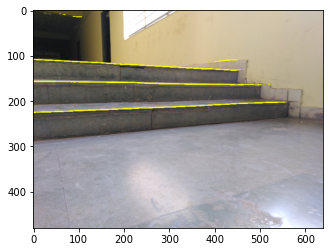

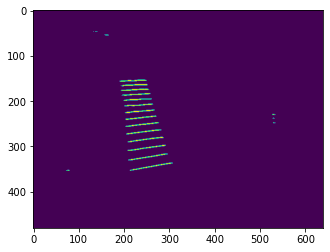

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


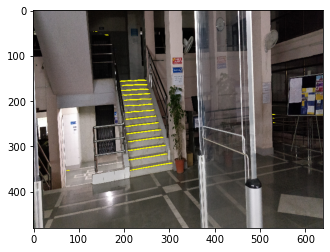

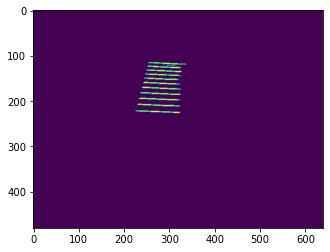

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


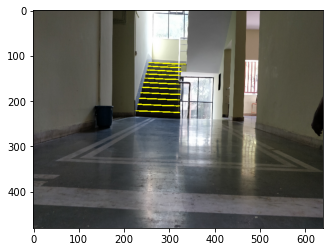

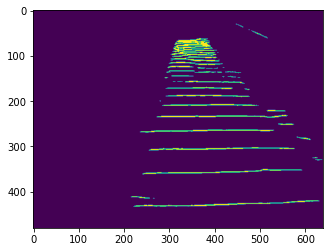

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


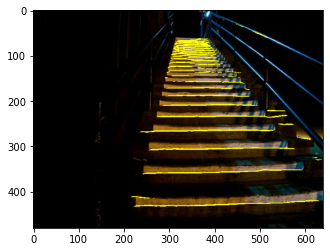

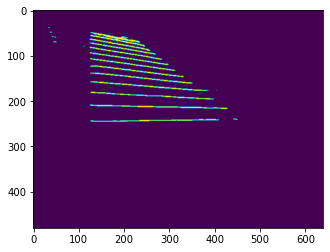

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


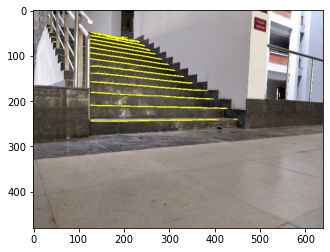

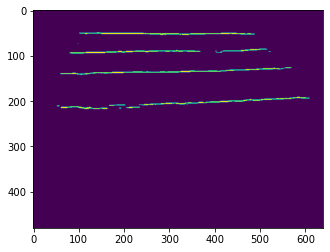

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


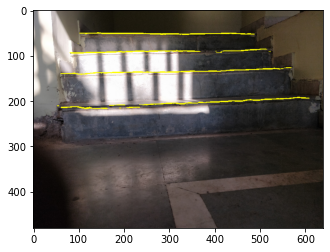

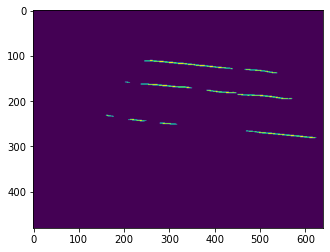

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


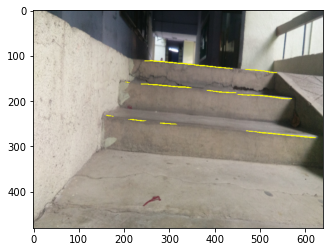

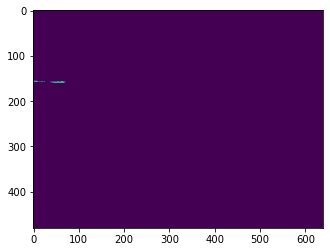

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


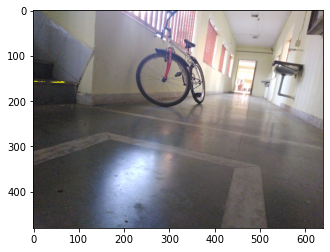

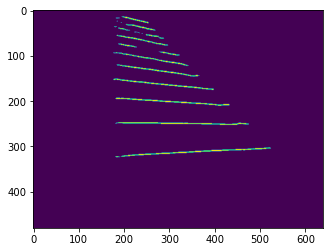

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


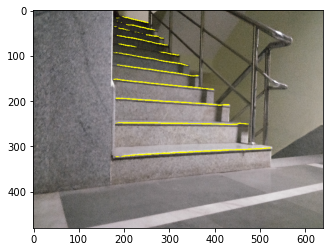

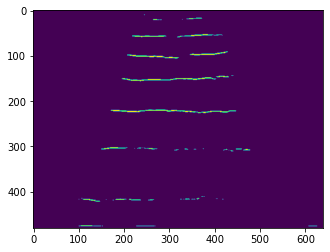

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


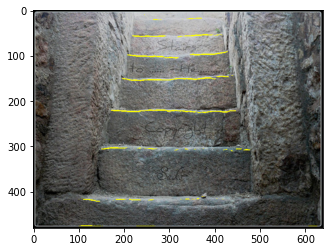

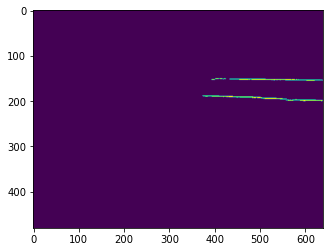

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


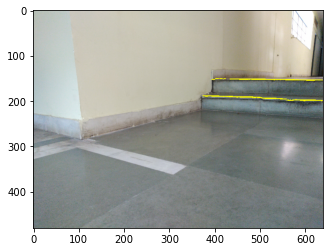

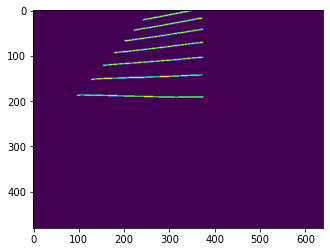

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


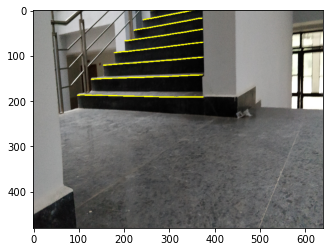

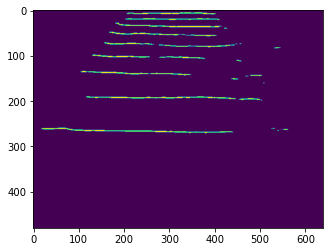

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


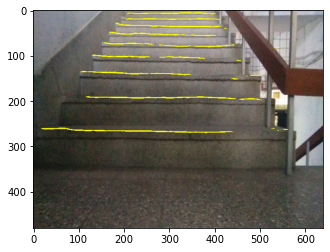

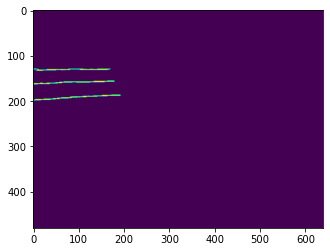

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


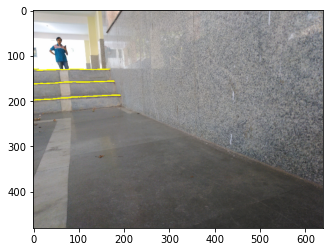

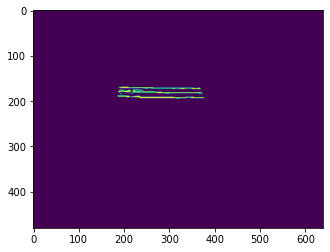

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


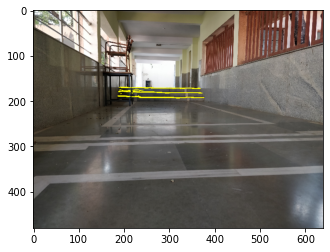

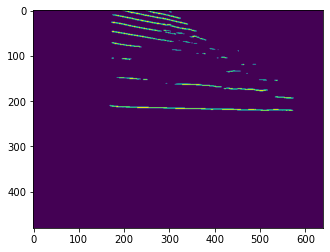

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


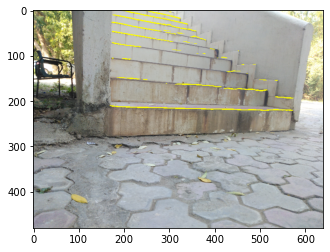

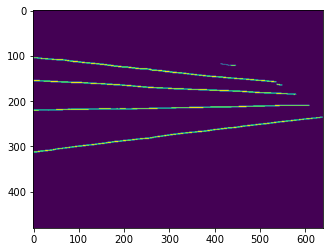

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


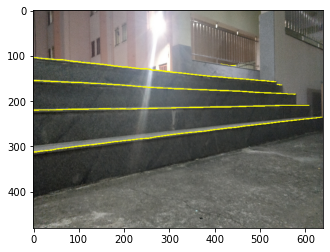

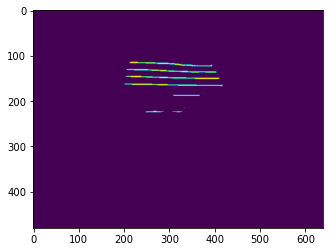

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


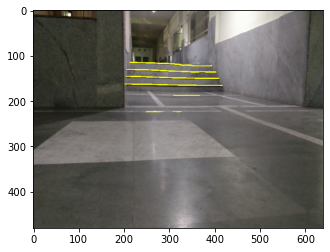

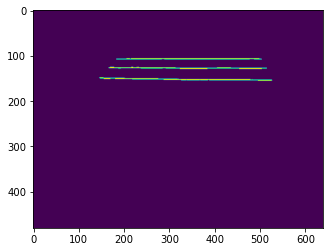

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


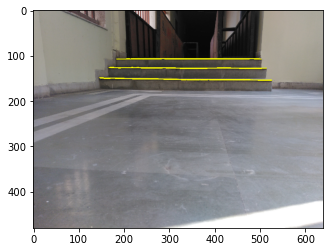

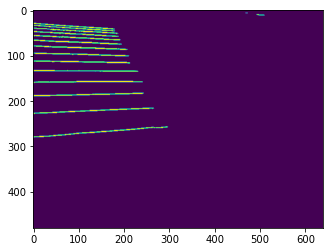

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


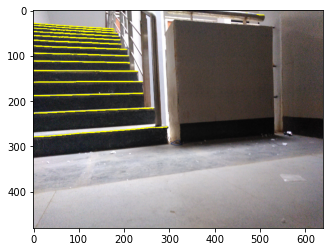

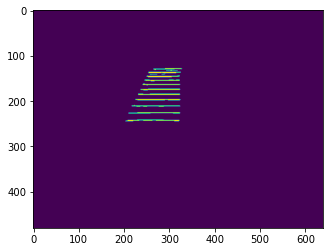

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


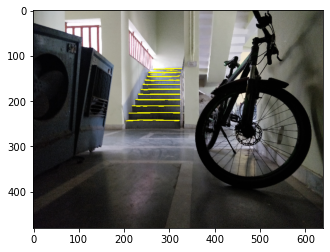

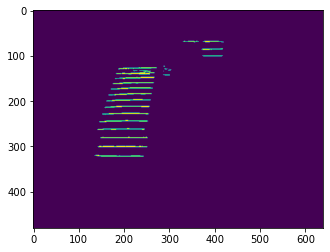

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


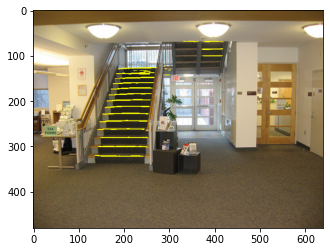

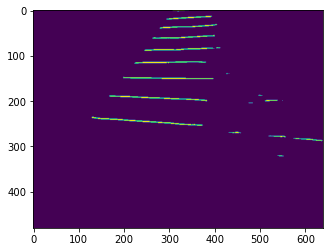

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


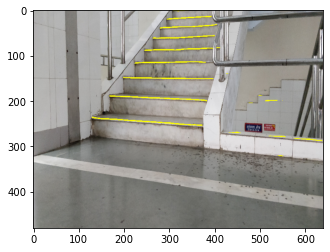

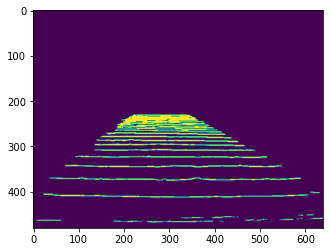

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


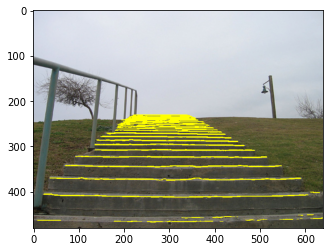

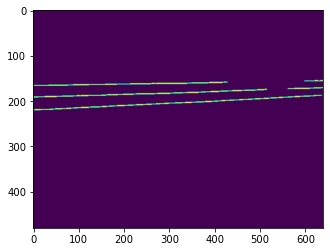

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


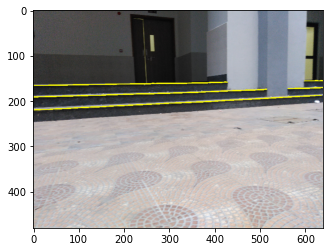

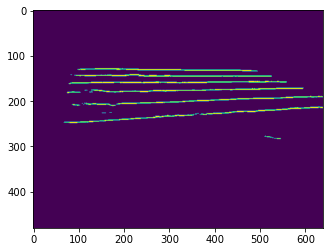

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


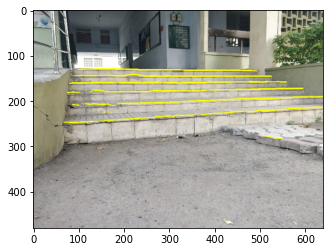

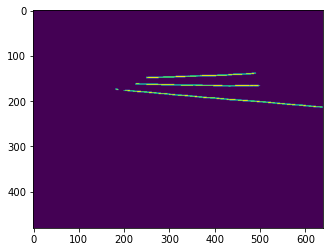

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


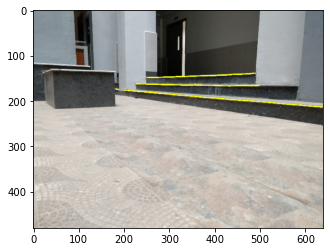

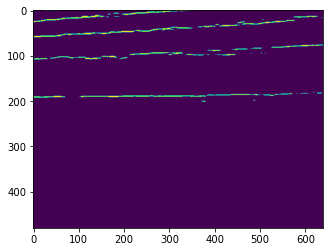

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


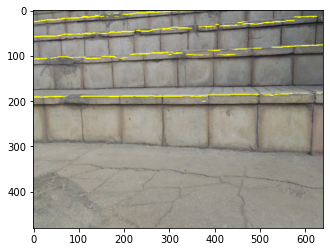

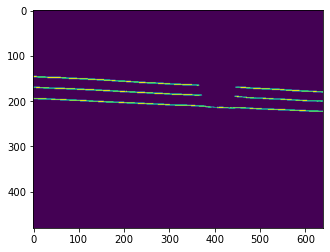

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


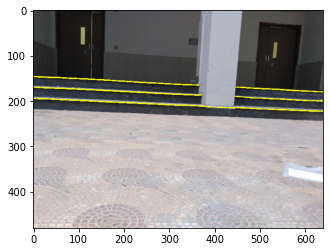

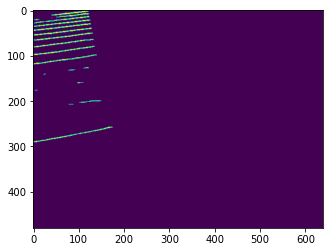

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


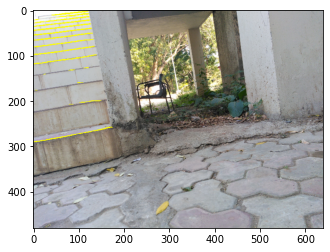

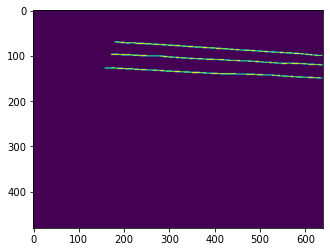

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


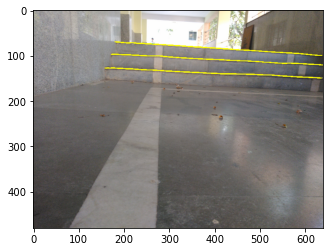

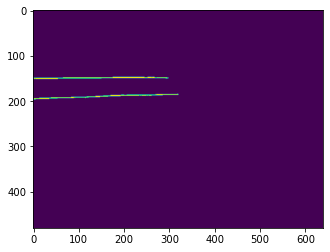

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


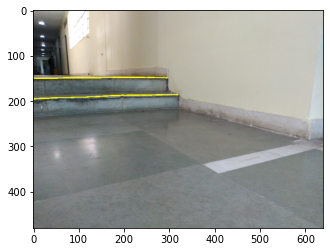

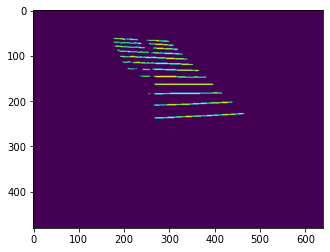

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


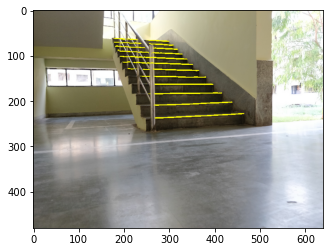

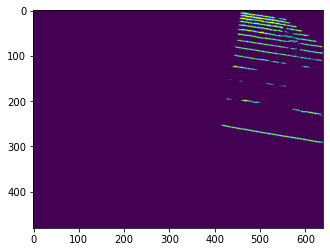

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


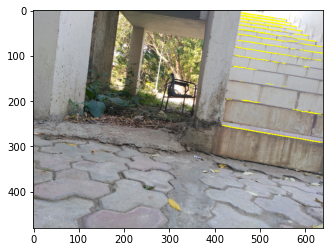

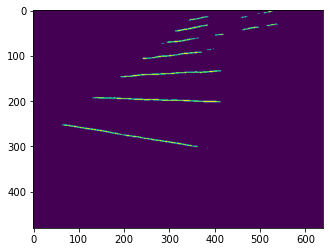

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


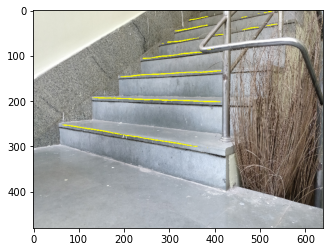

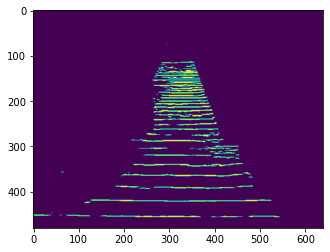

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


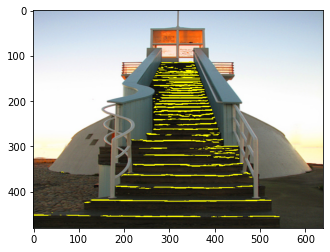

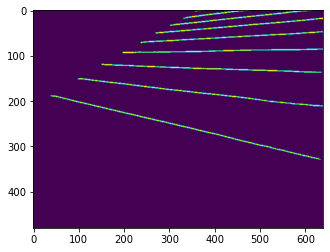

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


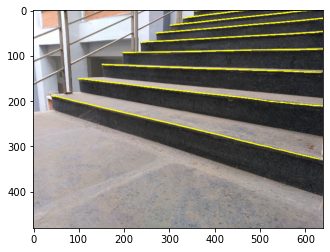

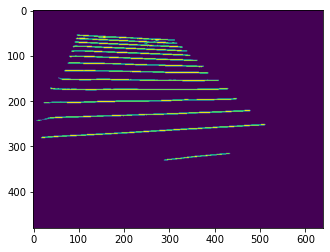

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


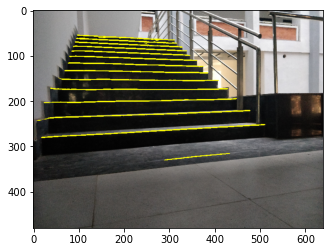

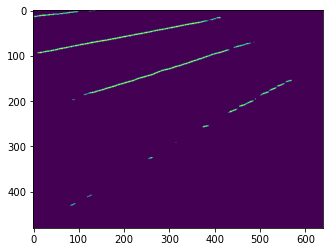

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


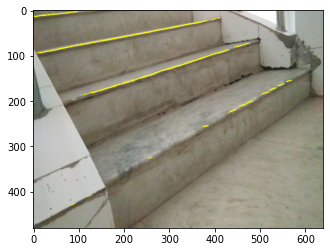

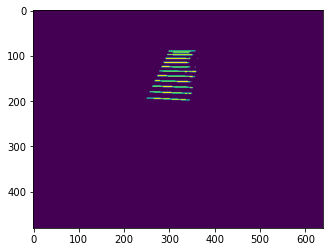

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


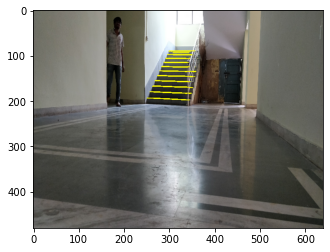

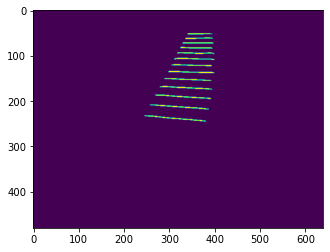

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


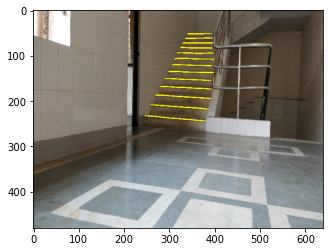

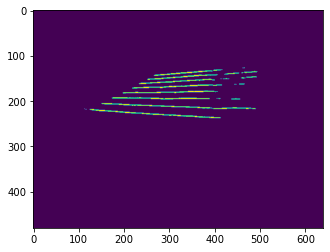

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


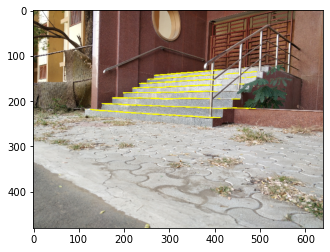

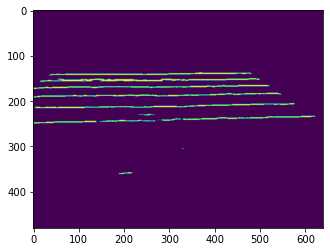

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


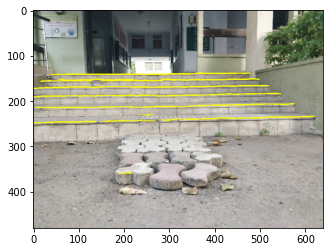

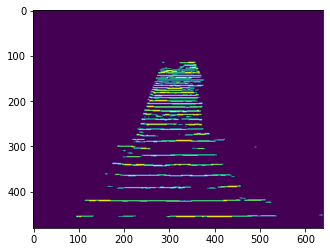

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


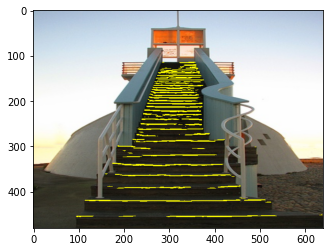

In [ ]:
for datafile in glob.glob('Dataset/test/*.png'):
    evaluate(datafile,True)

### Testing on other images

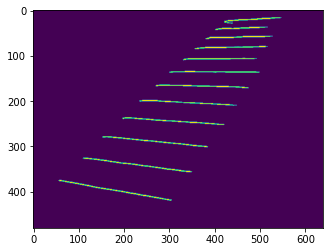

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


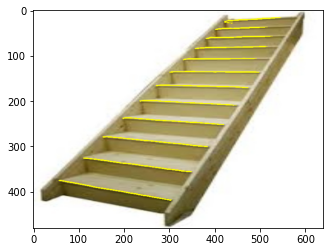

In [ ]:
resize_image('Dataset/pic2.jpg')
evaluate('Dataset/pic2.jpg')

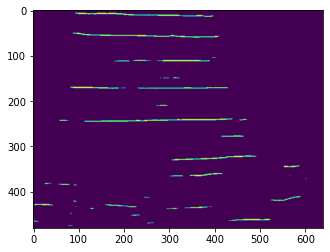

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


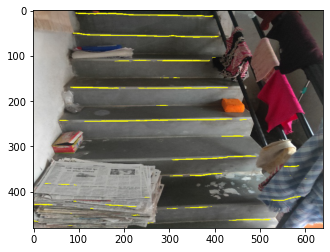

In [ ]:
resize_image('Dataset/pic6.jpg')
evaluate('Dataset/pic6.jpg',save=False)

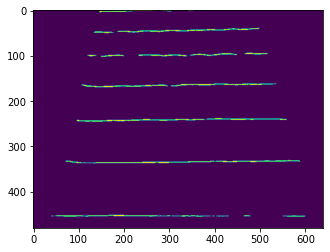

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


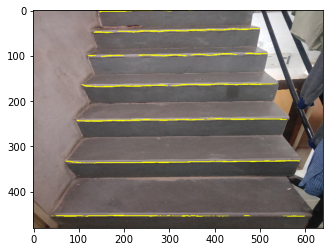

In [ ]:
resize_image('Dataset/pic7.jpg')
evaluate('Dataset/pic7.jpg',save=False)

In [ ]:
"""Zipping file to download"""
# import os
# import zipfile

# def zipdir(path, ziph):
#     # ziph is zipfile handle
#     for root, dirs, files in os.walk(path):
#         for file in files:
#             ziph.write(os.path.join(root, file))
# zipf = zipfile.ZipFile('model.zip', 'w', zipfile.ZIP_DEFLATED)
# zipdir('Dataset/models', zipf)
# zipf.close()